In [1]:
# Импорт библиотек
import seaborn as sns
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
# Делает визуализацию лучше по качеству
%config InlineBackend.figure_format = 'retina'

### Apple Quality
**Key Features:**  

**A_id**: Unique identifier for each fruit  
**Size**: Size of the fruit  
**Weight**: Weight of the fruit  
**Sweetness**: Degree of sweetness of the fruit  
**Crunchiness**: Texture indicating the crunchiness of the fruit  
**Juiciness**: Level of juiciness of the fruit  
**Ripeness**: Stage of ripeness of the fruit  
**Acidity**: Acidity level of the fruit  
**Quality**: Overall quality of the fruit  

In [3]:
# Импорт данных
apples = pd.read_csv('https://raw.githubusercontent.com/ElijahSum/mipt_visualization/master/week_03_visualization/apple_quality.csv')
apples.head()

,A_id,Size,Weight,Sweetness,Crunchiness,Juiciness,Ripeness,Acidity,Quality
0,0.0,-3.970049,-2.512336,5.346330,-1.012009,1.844900,0.329840,-0.491590483,good
1,1.0,-1.195217,-2.839257,3.664059,1.588232,0.853286,0.867530,-0.722809367,good
2,2.0,-0.292024,-1.351282,-1.738429,-0.342616,2.838636,-0.038033,2.621636473,bad
3,3.0,-0.657196,-2.271627,1.324874,-0.097875,3.637970,-3.413761,0.790723217,good
4,4.0,1.364217,-1.296612,-0.384658,-0.553006,3.030874,-1.303849,0.501984036,good


In [4]:
# Информация о датафрейме. 9 колонок, 4001 строка, но 1 строка заполнена только у колонки Acidity и тип этой колонки object.
# Ниже дополнительная проверка пустой строки.
apples.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4001 entries, 0 to 4000
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   A_id         4000 non-null   float64
 1   Size         4000 non-null   float64
 2   Weight       4000 non-null   float64
 3   Sweetness    4000 non-null   float64
 4   Crunchiness  4000 non-null   float64
 5   Juiciness    4000 non-null   float64
 6   Ripeness     4000 non-null   float64
 7   Acidity      4001 non-null   object 
 8   Quality      4000 non-null   object 
dtypes: float64(7), object(2)
memory usage: 281.4+ KB


In [5]:
# Кол-во уникальных id
apples['A_id'].nunique()

4000

In [6]:
# Строка с пустыми значениями, кроме Acidity - строка с автором датасета, ее надо удалить
apples[apples['A_id'].isnull()]

,A_id,Size,Weight,Sweetness,Crunchiness,Juiciness,Ripeness,Acidity,Quality
4000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Created_by_Nidula_Elgiriyewithana,NaN


In [7]:
# Удаление строки с пустыми значениями и приведение колонки с id к типу int, Acidity к типу float
apples = apples.dropna(subset=['A_id'])
apples['A_id'] = apples['A_id'].astype(int)
apples['Acidity'] = apples['Acidity'].astype(float)
apples

,A_id,Size,Weight,Sweetness,Crunchiness,Juiciness,Ripeness,Acidity,Quality
0,0,-3.970049,-2.512336,5.346330,-1.012009,1.844900,0.329840,-0.491590,good
1,1,-1.195217,-2.839257,3.664059,1.588232,0.853286,0.867530,-0.722809,good
2,2,-0.292024,-1.351282,-1.738429,-0.342616,2.838636,-0.038033,2.621636,bad
3,3,-0.657196,-2.271627,1.324874,-0.097875,3.637970,-3.413761,0.790723,good
4,4,1.364217,-1.296612,-0.384658,-0.553006,3.030874,-1.303849,0.501984,good
...,...,...,...,...,...,...,...,...,...
3995,3995,0.059386,-1.067408,-3.714549,0.473052,1.697986,2.244055,0.137784,bad
3996,3996,-0.293118,1.949253,-0.204020,-0.640196,0.024523,-1.087900,1.854235,good
3997,3997,-2.634515,-2.138247,-2.440461,0.657223,2.199709,4.763859,-1.334611,bad
3998,3998,-4.008004,-1.779337,2.366397,-0.200329,2.161435,0.214488,-2.229720,good


### Задача 1. Сравнение качества работы kNN при разных параметрах k
На лекциях и семинарах мы разбирали возможности для применения стандартных библиотек при работе с алгоритмом kNN. Мы также обращали внимание, что существует большое количество кастомных библиотек для создания более тонкой и кастомной визуализации. Одна из них — библиотека `mlxtend.plotting`.  

Эта библиотека позволяет создавать [удобные визуализации](https://rasbt.github.io/mlxtend/) работы алгоритмов машинного обучения. В ней есть функция `plot_decision_regions`, которая позволяет создавать визуализации для алгоритмов классификации.

#### Задача 1.1 (2 балла)
**Напишите функцию, которая будет:**

1. Отбирать все числовые признаки в датасете.
2. Перебирать все сочетания по два признака (без повторений) и запускать для каждой пары признаков алгоритм kNN (с k = 10). Для каждой итерации необходимо считать `accuracy`. Зависимая переменная $y$ указывается отдельно при подаче в функцию.
3. Возвращает названия двух признаков, которые дали наибольший `accuracy score`. Если `accuracy score` совпадают для двух или нескольких пар, верните первую найденную вами пару.  

Прототип может выглядеть примерно так:
```
def knn_two_features(df, y):
  '''
  df - датасет, который мы подаем для перебора алгоритмов
  y - зависимая переменная (класс признаков), которую мы хотим предсказать
  '''

  ...

  return [first_feature, second_feature]
  ```

In [8]:
# Импорт библиотек
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
#from sklearn.preprocessing import MinMaxScaler
from itertools import combinations

In [9]:
# Преобразование колонки Quality в числовой формат (1 - good, 0 - bad)
apples['Quality_num'] = apples['Quality'].map({'good': 1, 'bad': 0})

In [10]:
# Целевой признак сбалансирован по кол-ву
apples['Quality'].value_counts()

good    2004
bad     1996
Name: Quality, dtype: int64

In [11]:
# Функция для определения лучшей пары признаков по accuracy с использованием kNN
def knn_two_features(df, y_col):
    '''
    Функция для определения лучшей пары признаков по accuracy с использованием kNN
    df - датасет, который мы подаем для перебора алгоритмов
    y_col - зависимая переменная (класс признаков), которую мы хотим предсказать
    '''
    # Отбор столбцов с типом float, исключая целевую переменную и id
    float_features = df.select_dtypes(include=['float']).columns.tolist()

    best_accuracy = 0
    best_features = None
    
    # Перебор всех сочетаний по два признака (без повторений) и запуск knn с подсчетом accuracy
    for features in combinations(float_features, 2):
        X = df[list(features)]
        y = df[y_col]
        
        # Разделение данных на обучающую и тестовую выборки
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
        
        # Стандартизация признаков
        #scaler = MinMaxScaler()
        #X_train_scaled = scaler.fit_transform(X_train)
        #X_test_scaled = scaler.transform(X_test)
        
        # Инициализация и обучение модели kNN
        model = KNeighborsClassifier(n_neighbors=10)
        model.fit(X_train, y_train)
        
        # Предсказание и вычисление accuracy
        y_pred = model.predict(X_test)
        accuracy = accuracy_score(y_test, y_pred)
        
        # print для наглядности, можно убрать
        print(features, accuracy) 
        
        # Обновление лучшего результата
        if accuracy > best_accuracy:
            best_accuracy = accuracy
            best_features = features
    
    return best_features, best_accuracy

In [12]:
# Использование функции knn_two_features
best_features, best_accuracy = knn_two_features(apples, 'Quality_num')
print(f'Лучшие признаки: {best_features}, Accuracy: {best_accuracy}')

('Size', 'Weight') 0.62
('Size', 'Sweetness') 0.64875
('Size', 'Crunchiness') 0.62375
('Size', 'Juiciness') 0.65125
('Size', 'Ripeness') 0.6325
('Size', 'Acidity') 0.635
('Weight', 'Sweetness') 0.6025
('Weight', 'Crunchiness') 0.5975
('Weight', 'Juiciness') 0.6175
('Weight', 'Ripeness') 0.60125
('Weight', 'Acidity') 0.6075
('Sweetness', 'Crunchiness') 0.62125
('Sweetness', 'Juiciness') 0.61
('Sweetness', 'Ripeness') 0.65625
('Sweetness', 'Acidity') 0.55125
('Crunchiness', 'Juiciness') 0.63
('Crunchiness', 'Ripeness') 0.61375
('Crunchiness', 'Acidity') 0.5575
('Juiciness', 'Ripeness') 0.68
('Juiciness', 'Acidity') 0.60375
('Ripeness', 'Acidity') 0.575
Лучшие признаки: ('Juiciness', 'Ripeness'), Accuracy: 0.68


#### Задача 1.2 (2 балла)
Мы получили два признака, которые вместе дают наибольший `accuracy score`. Теперь покрутите их, одновременно изменяя параметр `k`. С помощью `plot_decision_regions` библиотеки `mlxtend.plotting` постройте поле 3х3 из визуализаций результатов работы алгоритма kNN с разными параметрами `k`. Параметры `k` можно взять следующие: 1, 2, 5, 10, 15, 20, 30, 40, 50.

Подробнее о том, как работать с этой функцией, можно почитать [в инструкции](https://rasbt.github.io/mlxtend/user_guide/plotting/plot_decision_regions/). Там же есть информация, как создать поле размером 3х3 для построения графиков.

In [13]:
#!pip install mlxtend

In [14]:
# Импорт библиотеки
from mlxtend.plotting import plot_decision_regions
import matplotlib.gridspec as gridspec

In [15]:
# Отбор данных по лучшим признакам
X = apples[list(best_features)].values
y = apples['Quality_num'].values

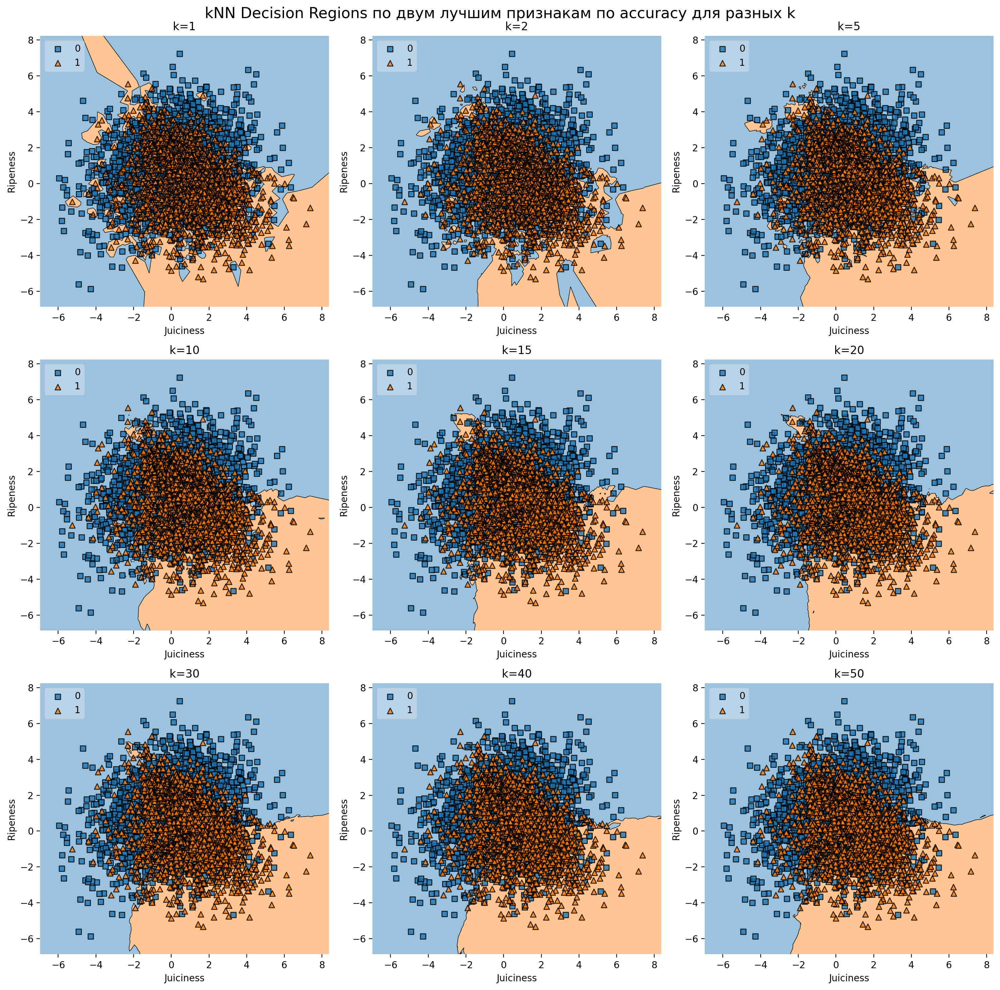

In [16]:
# Параметры k для алгоритма kNN
k_values = [1, 2, 5, 10, 15, 20, 30, 40, 50]

# Создание поля 3x3 для графиков
gs = gridspec.GridSpec(3, 3)
fig = plt.figure(figsize=(15, 15))

# Добавление общего заголовка к figure
fig.suptitle('kNN Decision Regions по двум лучшим признакам по accuracy для разных k', fontsize=16)

# Визуализация результатов работы алгоритма kNN для различных k
for idx, k in enumerate(k_values):
    ax = plt.subplot(gs[idx // 3, idx % 3])
    clf = KNeighborsClassifier(n_neighbors=k)
    clf.fit(X, y)
    plot_decision_regions(X=X, y=y, clf=clf, legend=2, ax=ax)
    ax.set_title(f'k={k}')
    ax.set_xlabel(best_features[0])
    ax.set_ylabel(best_features[1])

plt.tight_layout()
plt.show()

#### Задача 1.3 (1 балл)
Функция `plot_decision_regions` удобна тем, что ее можно использовать для визуализации разных алгоритмов классификации.

- Выберите два параметра, которые кажутся вам наиболее важными при оценке качества яблок. Используйте их, чтобы построить алгоритм решающего дерева.
- Также постройте решающее дерево для признаков, которые были отобраны в пункте 1.1.
- Создайте поле 1х2 и визуализируйте полученные результаты. Каждый график озаглавьте.

In [17]:
# Импорт библиотеки
from sklearn.tree import DecisionTreeClassifier

In [18]:
# Кажется, наиболее важные зреслость/спелость (Ripeness) и хрусткость (Crunchiness)
X_custom = apples[['Ripeness', 'Crunchiness']].values

In [19]:
# Создание моделей решающего дерева
model_custom = DecisionTreeClassifier()
model_best = DecisionTreeClassifier()

In [20]:
# Обучение моделей
model_custom.fit(X_custom, y)
model_best.fit(X, y)

DecisionTreeClassifier()

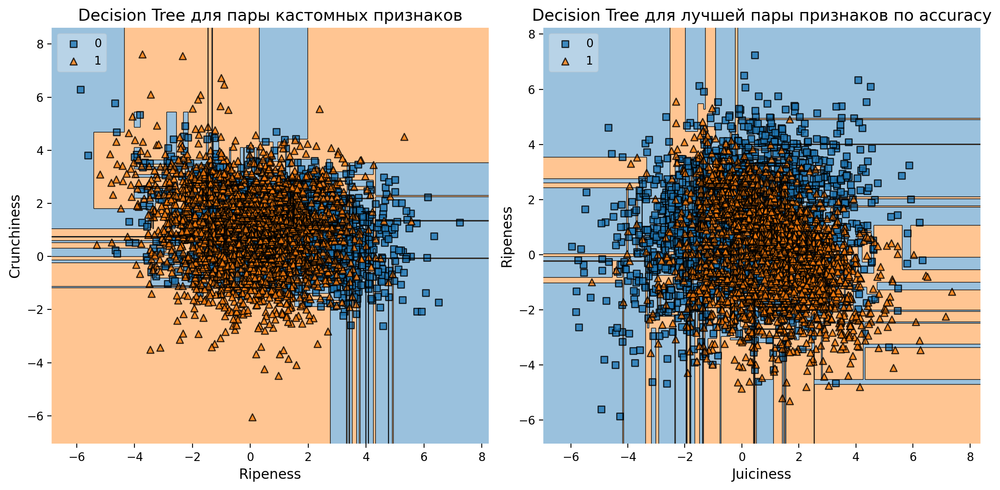

In [21]:
# Создание поля 1х2 для графиков
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))

# Визуализация для кастомных признаков
plot_decision_regions(X_custom, y, clf=model_custom, legend=2, ax=axes[0])
axes[0].set_title('Decision Tree для пары кастомных признаков', fontsize=14)
axes[0].set_xlabel('Ripeness', fontsize=12)
axes[0].set_ylabel('Crunchiness', fontsize=12)

# Визуализация для пары лучших признаков
plot_decision_regions(X, y, clf=model_best, legend=2, ax=axes[1])
axes[1].set_title('Decision Tree для лучшей пары признаков по accuracy', fontsize=14)
axes[1].set_xlabel('Juiciness', fontsize=12)
axes[1].set_ylabel('Ripeness', fontsize=12)

plt.tight_layout()
plt.show()

### Задача 2. Визуализация алгоритмов решающего дерева
#### Задача 2.1 (1 балл)
Аналогично пункту 1.1, создайте две функции для алгоритмов решающего дерева:

- Функцию, которая возвращает два параметра, дающие наибольший `accuracy score` при применении алгоритма решающего дерева.
- Такую же функцию, но которая возвращает три параметра (то есть перебирает все значения не по парам признаков, а по тройкам).

In [22]:
def dt_two_features(df, y_col):
    '''
    Функция для определения лучшей пары признаков по accuracy с использованием Decision Tree
    df - датасет, который мы подаем для перебора алгоритмов
    y_col - зависимая переменная (класс признаков), которую мы хотим предсказать
    '''
    # Отбор столбцов с типом float, исключая целевую переменную и id
    float_features = df.select_dtypes(include=['float']).columns.tolist()

    best_accuracy = 0
    best_features = None
    
    # Перебор всех сочетаний по два признака (без повторений) и запуск Decision Tree с подсчетом accuracy
    for features in combinations(float_features, 2):
        X = df[list(features)]
        y = df[y_col]

        # Разделение данных на обучающую и тестовую выборки
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
        
        # Стандартизация признаков
        #scaler = StandardScaler()
        #X_train_scaled = scaler.fit_transform(X_train)
        #X_test_scaled = scaler.transform(X_test)

        # Инициализация и обучение модели Decision Tree
        model = DecisionTreeClassifier(max_depth=5)
        model.fit(X_train, y_train)

        # Предсказание и вычисление accuracy
        y_pred = model.predict(X_test)
        accuracy = accuracy_score(y_test, y_pred)
        
        # print для наглядности, можно убрать
        print(features, accuracy)

        # Обновление лучшего результата
        if accuracy > best_accuracy:
            best_accuracy = accuracy
            best_features = features

    return best_features, best_accuracy

In [23]:
# Использование функции dt_two_features
best_features_dt2, best_accuracy_dt2 = dt_two_features(apples, 'Quality_num')
print(f'Лучшие признаки: {best_features_dt2}, Accuracy: {best_accuracy_dt2}')

('Size', 'Weight') 0.64625
('Size', 'Sweetness') 0.7
('Size', 'Crunchiness') 0.6475
('Size', 'Juiciness') 0.63875
('Size', 'Ripeness') 0.6375
('Size', 'Acidity') 0.6275
('Weight', 'Sweetness') 0.6275
('Weight', 'Crunchiness') 0.60875
('Weight', 'Juiciness') 0.6125
('Weight', 'Ripeness') 0.625
('Weight', 'Acidity') 0.62625
('Sweetness', 'Crunchiness') 0.62
('Sweetness', 'Juiciness') 0.63375
('Sweetness', 'Ripeness') 0.6225
('Sweetness', 'Acidity') 0.6225
('Crunchiness', 'Juiciness') 0.65625
('Crunchiness', 'Ripeness') 0.625
('Crunchiness', 'Acidity') 0.56375
('Juiciness', 'Ripeness') 0.69875
('Juiciness', 'Acidity') 0.6325
('Ripeness', 'Acidity') 0.59625
Лучшие признаки: ('Size', 'Sweetness'), Accuracy: 0.7


In [24]:
def dt_three_features(df, y_col):
    '''
    Функция для определения лучших трех признаков по accuracy с использованием Decision Tree
    df - датасет, который мы подаем для перебора алгоритмов
    y_col - зависимая переменная (класс признаков), которую мы хотим предсказать
    '''
    # Отбор столбцов с типом float, исключая целевую переменную и id
    float_features = df.select_dtypes(include=['float']).columns.tolist()

    best_accuracy = 0
    best_features = None

    # Перебор всех сочетаний по три признака (без повторений) и запуск Decision Tree с подсчетом accuracy
    for features in combinations(float_features, 3):
        X = df[list(features)]
        y = df[y_col]

        # Разделение данных на обучающую и тестовую выборки
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

        # Инициализация и обучение модели Decision Tree
        model = DecisionTreeClassifier(max_depth=5)
        model.fit(X_train, y_train)

        # Предсказание и вычисление accuracy
        y_pred = model.predict(X_test)
        accuracy = accuracy_score(y_test, y_pred)
        
        # print для наглядности, можно убрать
        print(features, accuracy)

        # Обновление лучшего результата
        if accuracy > best_accuracy:
            best_accuracy = accuracy
            best_features = features

    return best_features, best_accuracy

In [25]:
# Использование функции dt_three_features
best_features_dt3, best_accuracy_dt3 = dt_three_features(apples, 'Quality_num')
print(f'Лучшие признаки: {best_features_dt3}, Accuracy: {best_accuracy_dt3}')

('Size', 'Weight', 'Sweetness') 0.70625
('Size', 'Weight', 'Crunchiness') 0.64375
('Size', 'Weight', 'Juiciness') 0.7
('Size', 'Weight', 'Ripeness') 0.65625
('Size', 'Weight', 'Acidity') 0.67625
('Size', 'Sweetness', 'Crunchiness') 0.7025
('Size', 'Sweetness', 'Juiciness') 0.7125
('Size', 'Sweetness', 'Ripeness') 0.71125
('Size', 'Sweetness', 'Acidity') 0.71125
('Size', 'Crunchiness', 'Juiciness') 0.7025
('Size', 'Crunchiness', 'Ripeness') 0.6625
('Size', 'Crunchiness', 'Acidity') 0.65125
('Size', 'Juiciness', 'Ripeness') 0.73125
('Size', 'Juiciness', 'Acidity') 0.71
('Size', 'Ripeness', 'Acidity') 0.665
('Weight', 'Sweetness', 'Crunchiness') 0.65375
('Weight', 'Sweetness', 'Juiciness') 0.6775
('Weight', 'Sweetness', 'Ripeness') 0.6475
('Weight', 'Sweetness', 'Acidity') 0.6475
('Weight', 'Crunchiness', 'Juiciness') 0.65875
('Weight', 'Crunchiness', 'Ripeness') 0.63375
('Weight', 'Crunchiness', 'Acidity') 0.62
('Weight', 'Juiciness', 'Ripeness') 0.70875
('Weight', 'Juiciness', 'Acidity'

#### Задача 2.2 (1 балл)
Создайте три различных двумерных графика для визуализации результатов работы алгоритма случайного леса (из пункта 1 задачи 2.1). Можете использовать любые библиотеки (включая модули `graphviz`, `dtreeviz`).

In [26]:
#!pip install dtreeviz graphviz

In [27]:
!dot -V

dot - graphviz version 10.0.1 (20240210.2158)


In [28]:
# Импорт библиотек
import dtreeviz
import graphviz
from dtreeviz import decision_boundaries

In [29]:
# Отбор данных по лучшим признакам
X_dt2 = apples[list(best_features_dt2)].values

# Создание и обучение модели
model_dt2 = DecisionTreeClassifier(max_depth=5, random_state=42)
model_dt2.fit(X_dt2, y)

DecisionTreeClassifier(max_depth=5, random_state=42)

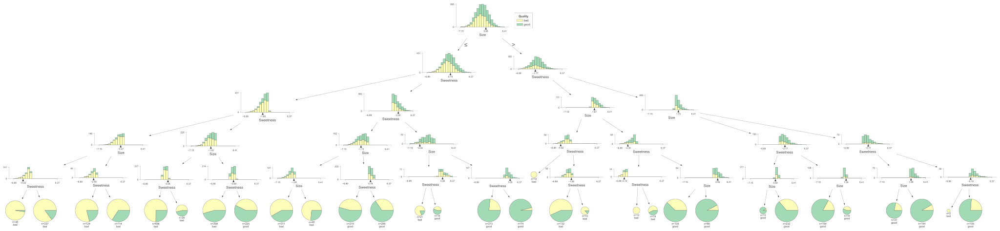

In [30]:
# Визуализация структуры дерева
viz2 = dtreeviz.model(model_dt2,
                     X_dt2,
                     y,
                     target_name='Quality',
                     feature_names=best_features_dt2,
                     class_names=['bad', 'good'])
viz2.view()

In [31]:
# Сохранение визуализации структуры дерева
v2 = viz2.view()
#v2.show()
v2.save('2_2_dtreeviz.svg')

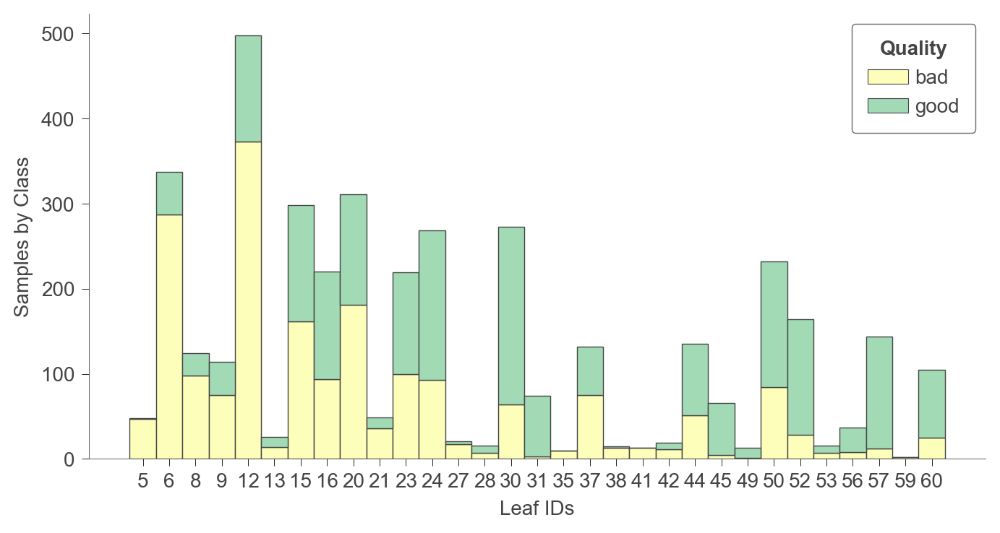

In [32]:
# Информация о листьях дерева
viz2.ctree_leaf_distributions(figsize=(8, 4))

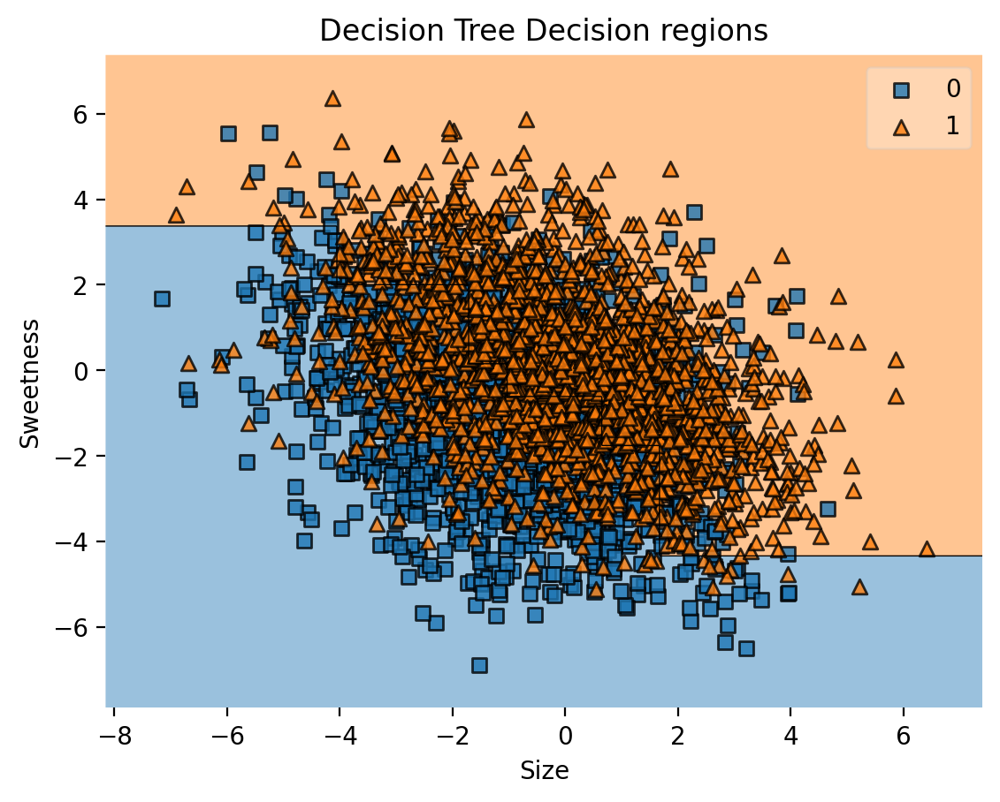

In [33]:
# Визуализация границы решения
plot_decision_regions(X_dt2, y, clf=model_dt2)
plt.title('Decision Tree Decision regions')
plt.xlabel(best_features_dt2[0])
plt.ylabel(best_features_dt2[1])
plt.show()

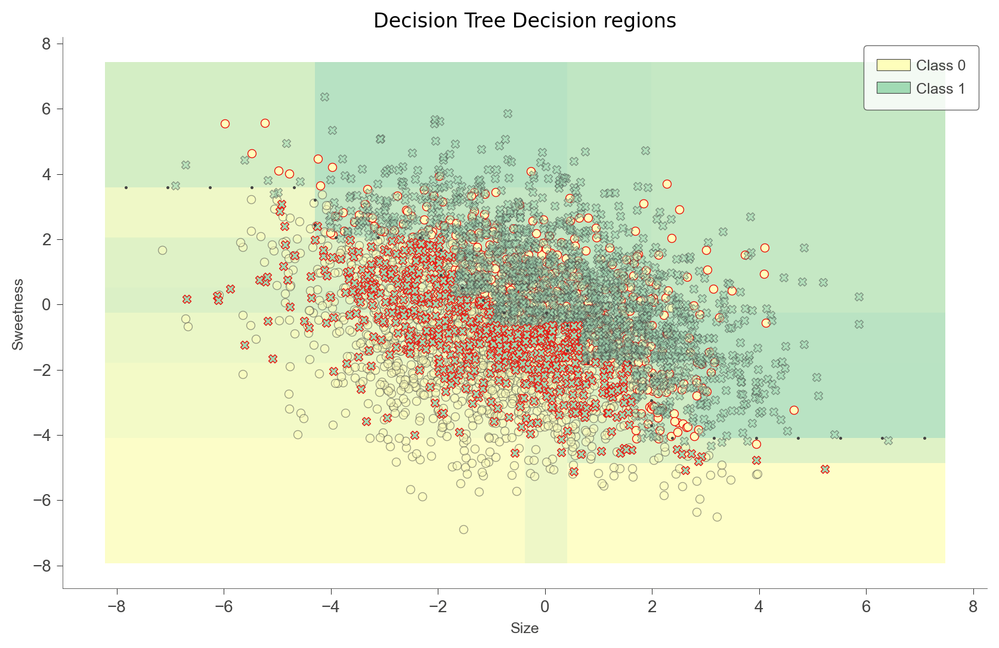

In [34]:
# Визуализация границы решения c dtreeviz
fig, ax = plt.subplots(1, 1, figsize=(10,6))
decision_boundaries(model_dt2, X_dt2, y, ax=ax,
                    ntiles=20,
                    tile_fraction=1.0, # make continuous, no white borders between tiles
                    markers=['o','X'],
                    feature_names=list(best_features_dt2),
                    colors={'scatter_marker_alpha':.5})
ax.set_title('Decision Tree Decision regions')
plt.show()

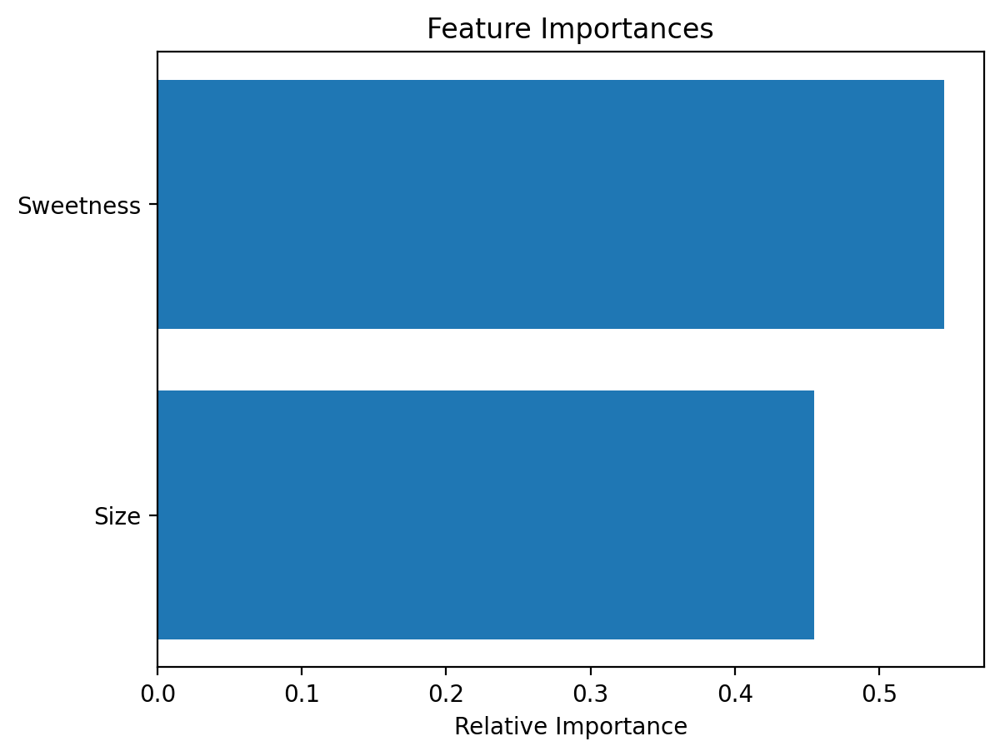

In [35]:
# Важность признаков
features = best_features_dt2
importances = model_dt2.feature_importances_
indices = np.argsort(importances)

plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

#### Задача 2.3 (1 балл)
Аналогично предыдущему пункту, создайте три трехмерных графика (или псевдотрехмерных — двумерных, где цветом отображено третье измерение) для того алгоритма случайного леса с тремя параметрами, который вы получили во втором пункте задачи 2.1.

In [36]:
# Отбор данных по лучшим признакам
X_dt3 = apples[list(best_features_dt3)].values

# Создание и обучение модели
model_dt3 = DecisionTreeClassifier(max_depth=5, random_state=42)
model_dt3.fit(X_dt3, y)

DecisionTreeClassifier(max_depth=5, random_state=42)

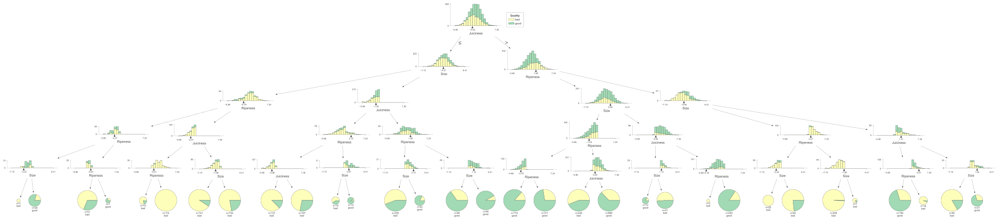

In [37]:
# Визуализация структуры дерева
viz3 = dtreeviz.model(model_dt3,
                      X_dt3,
                      y,
                      target_name='Quality',
                      feature_names=best_features_dt3,
                      class_names=['bad', 'good'])
viz3.view()

In [38]:
# Сохранение визуализации структуры дерева
v3 = viz3.view()
#v3.show()
v3.save('2_3_dtreeviz.svg')

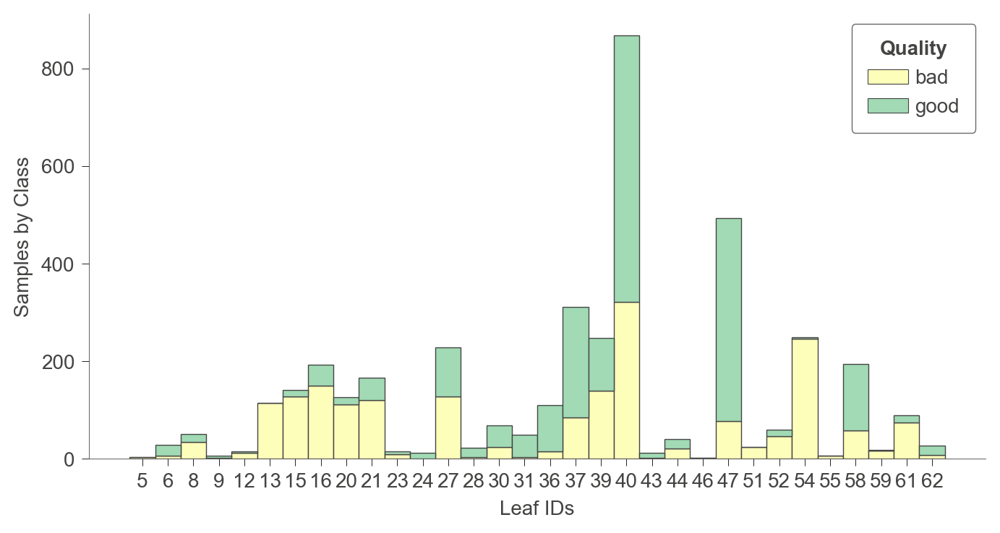

In [39]:
# Информация о листьях дерева
viz3.ctree_leaf_distributions(figsize=(8, 4))

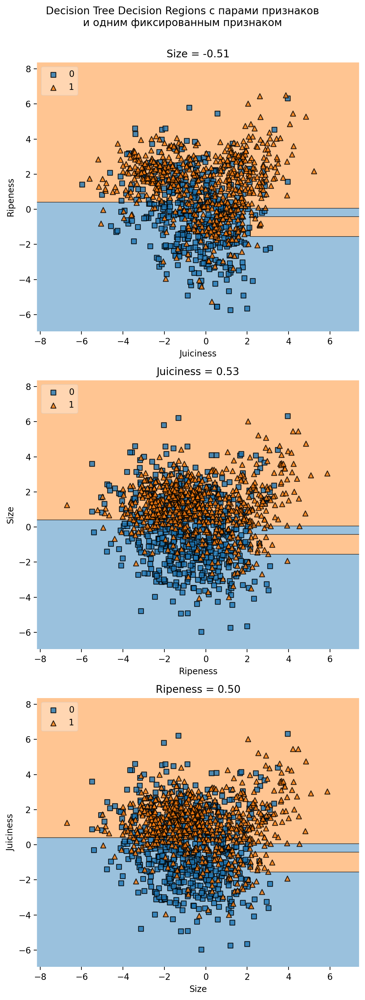

In [40]:
# Визуализация границы решения для пары признаков 0, 1; 0, 2; 1, 2

# Медианные значения для каждого признака
median_values = np.median(X_dt3, axis=0)

# Визуализация решающих областей, фиксируя по одному признаку за раз
fig, axarr = plt.subplots(3, 1, figsize=(6, 16))

# Имена признаков для подписей
features3 = list(best_features_dt3)

for idx in range(3):
    ax = axarr[idx]
    # Фиксация одного из признаков
    value = median_values[idx]
    width = 0.75
    
    plot_decision_regions(X_dt3, y, clf=model_dt3,
                          filler_feature_values={2: value},
                          filler_feature_ranges={2: width},
                          legend=2, ax=ax)
    
    # Подписи осей
    remaining_features = [features3[(idx + 1) % 3], features3[(idx + 2) % 3]]
    ax.set_xlabel(remaining_features[0])
    ax.set_ylabel(remaining_features[1])
    ax.set_title(f'{features3[idx]} = {value:.2f}')

fig.suptitle('Decision Tree Decision Regions с парами признаков\nи одним фиксированным признаком', y=1.005)
plt.tight_layout()
plt.show()

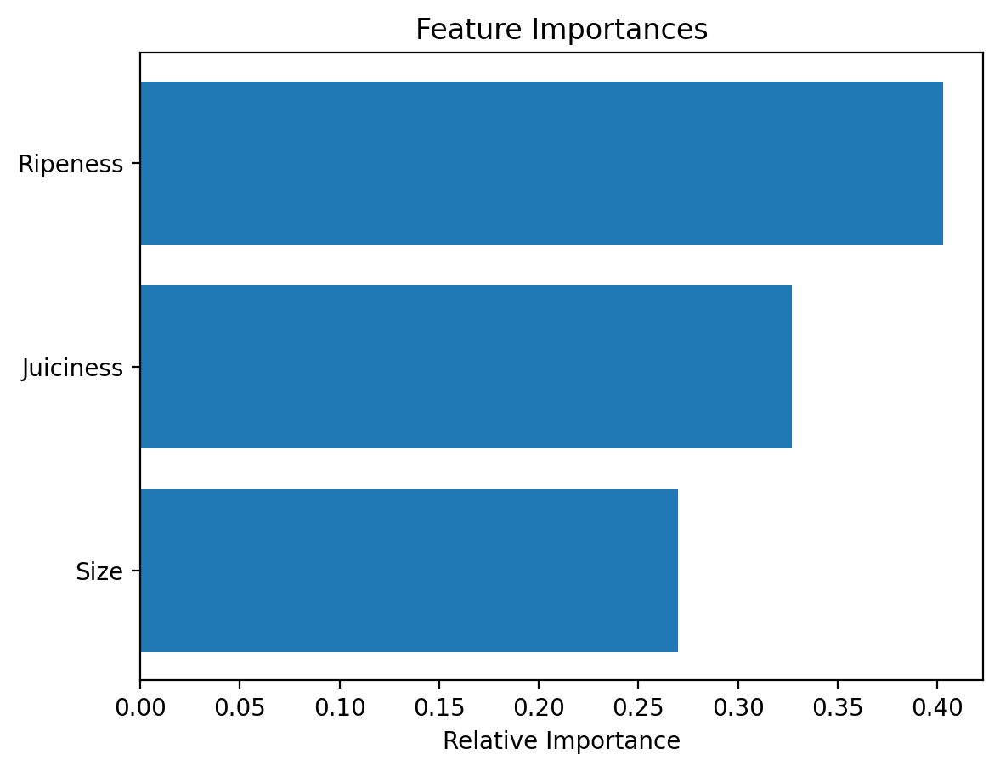

In [41]:
# Важность признаков
features3 = best_features_dt3
importances3 = model_dt3.feature_importances_
indices3 = np.argsort(importances3)

plt.title('Feature Importances')
plt.barh(range(len(indices3)), importances3[indices3], align='center')
plt.yticks(range(len(indices3)), [features3[i] for i in indices3])
plt.xlabel('Relative Importance')
plt.show()

### Задача 3. Градиентный спуск для функции одной переменной (2 балла)
На занятиях мы разбирали создание визуализации алгоритмов градиентного спуска. Напишите с нуля свой алгоритм градиентного спуска. Создайте визуализацию работы градиентного спуска на каждой итерации для следующей функции:  
$f(x) = x^6-3x^4+2x^2+1$  
Визуализацию снабдите названием, подписями к осям, а также добавьте текст с номером итерации (цвет выбирайте в зависимости от читаемости). Положение точки градиентного спуска на итерации $n$ можно изобразить в качестве `Scatter plot` или `Line plot`.

In [42]:
# Функция и её производная
def f(x):
    """
    Вычисляет значение функции для заданного x.
    
    Параметры:
    - x (np.ndarray): Входной массив значений, для которых требуется вычислить функцию.
    
    Возвращает:
    - np.ndarray: Значение функции f(x) для входного значения x.
    """
    return x**6 - 3*x**4 + 2*x**2 + 1

def grad_f(x):
    """
    Вычисляет градиент функции f(x) = x^6 - 3x^4 + 2x^2 + 1 по x.
    
    Параметры:
    - x (float): Точка, в которой требуется вычислить градиент.
    
    Возвращает:
    - float: Значение градиента функции f(x) в точке x.
    """
    return 6*x**5 - 12*x**3 + 4*x

In [43]:
# Импорт библиотек
from IPython.display import clear_output

In [44]:
def gradient_descent_visualization(grad, start_point, learning_rate=0.01, gamma=0.5, tolerance=1e-4, max_iterations=200):
    """
    Функция выполняет градиентный спуск для функции одной переменной с интерактивной визуализацией на каждой итерации.
    
    Параметры:
    grad (callable): Функция, вычисляющая градиент целевой функции.
    start_point (float): Начальная точка для поиска минимума.
    learning_rate (float): Размер шага.
    gamma (float): Коэффициент моментума.
    tolerance (float): Пороговое значение изменения функции для остановки алгоритма.
    max_iterations (int): Максимальное количество итераций.
   
    Возвращает:
    Ничего не возвращает.
    """
    x = start_point
    x_range = np.linspace(-1.5, 1.5, 400)
    y_range = f(x_range)
    # Начальная скорость изменения x
    v = 0
    
    for i in range(max_iterations):
        gradient = grad(x)
        clipped_gradient = np.clip(gradient, -10, 10)
        # Обновление скорости с учетом моментума
        v = gamma*v + learning_rate*clipped_gradient
        # Обновление положения x
        x -= v
        
        # Очистка текущего вывода и отображение графика
        clear_output(wait=True)
        plt.figure(figsize=(10, 6))
        plt.plot(x_range, y_range, label='f(x)')
        plt.scatter(x, f(x), color='red', marker='x', label='Текущий шаг')
        
        # Добавление текста с номером итерации
        text_x = min(max(x, x_range[0]), x_range[-1])
        text_y = min(max(f(x)+0.5, np.min(y_range)), np.max(y_range))
        plt.text(x=text_x, y=text_y, s=f'Итерация: {i+1}')
        
        # Заголовок и подписи осей, отображение легенды
        plt.title('Визуализация работы градиентного спуска для функции $f(x) = x^6 - 3x^4 + 2x^2 + 1$')
        plt.xlabel('$x$')
        plt.ylabel('$f(x)$')
        plt.legend()
        plt.show()
        plt.pause(0.05)
        
        # Проверка условия
        if abs(clipped_gradient) < tolerance:
            print(f'Сходимость достигнута на итерации {i+1}')
            break

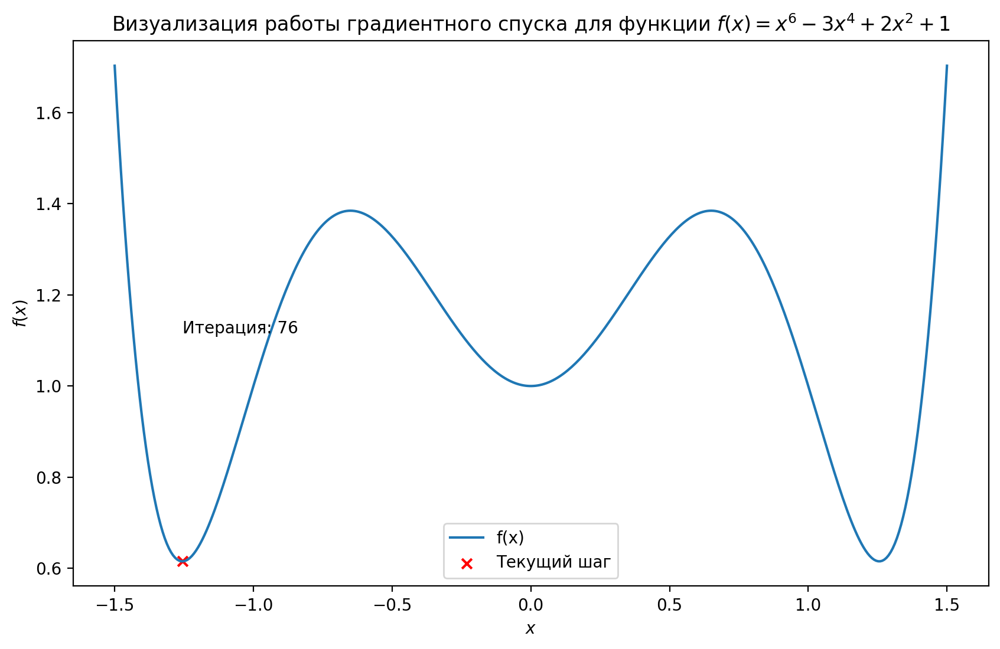

Сходимость достигнута на итерации 76


In [45]:
# Использование функции gradient_descent_visualization с start_point=-10
gradient_descent_visualization(grad_f, start_point=-10)

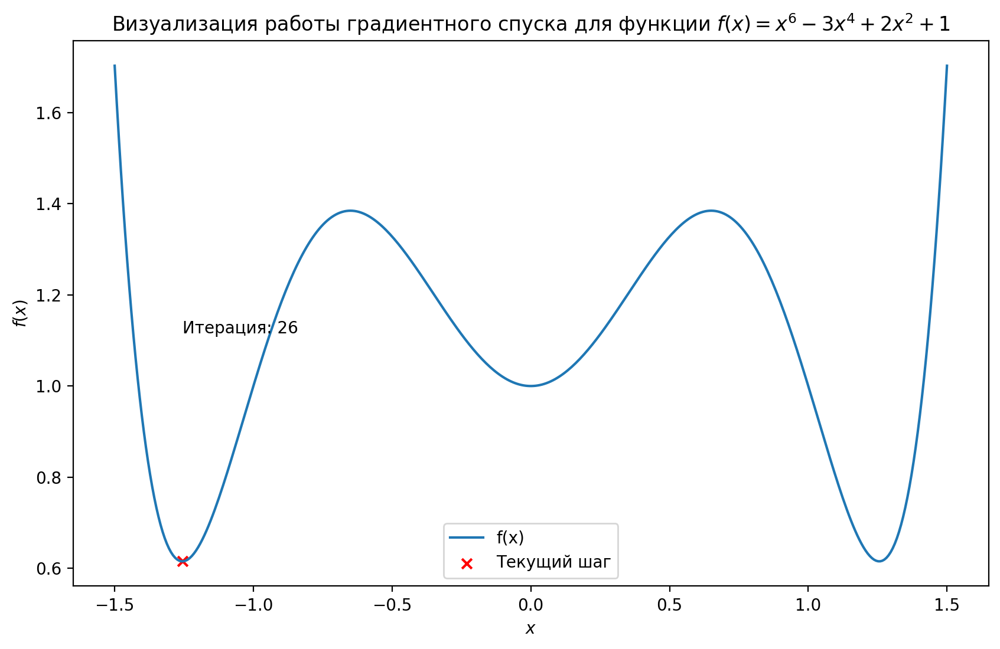

Сходимость достигнута на итерации 26


In [46]:
# Использование функции gradient_descent_visualization с start_point=-1.5
gradient_descent_visualization(grad_f, start_point=-1.5)

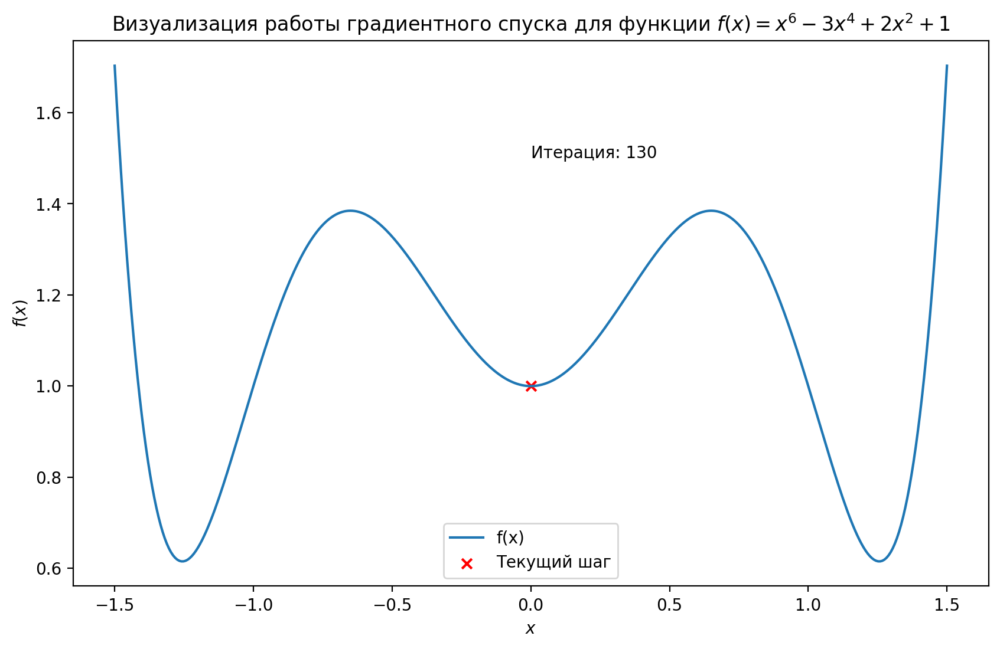

Сходимость достигнута на итерации 130


In [47]:
# Использование функции gradient_descent_visualization с start_point=-0.6
gradient_descent_visualization(grad_f, start_point=-0.6)

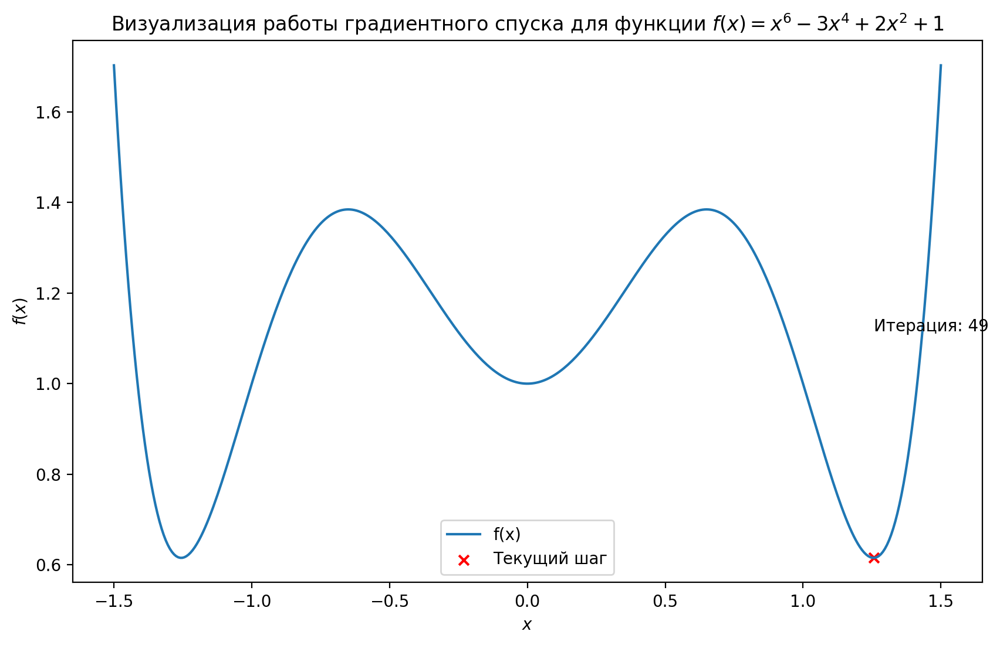

Сходимость достигнута на итерации 49


In [48]:
# Использование функции gradient_descent_visualization с start_point=0.7
gradient_descent_visualization(grad_f, start_point=0.7)

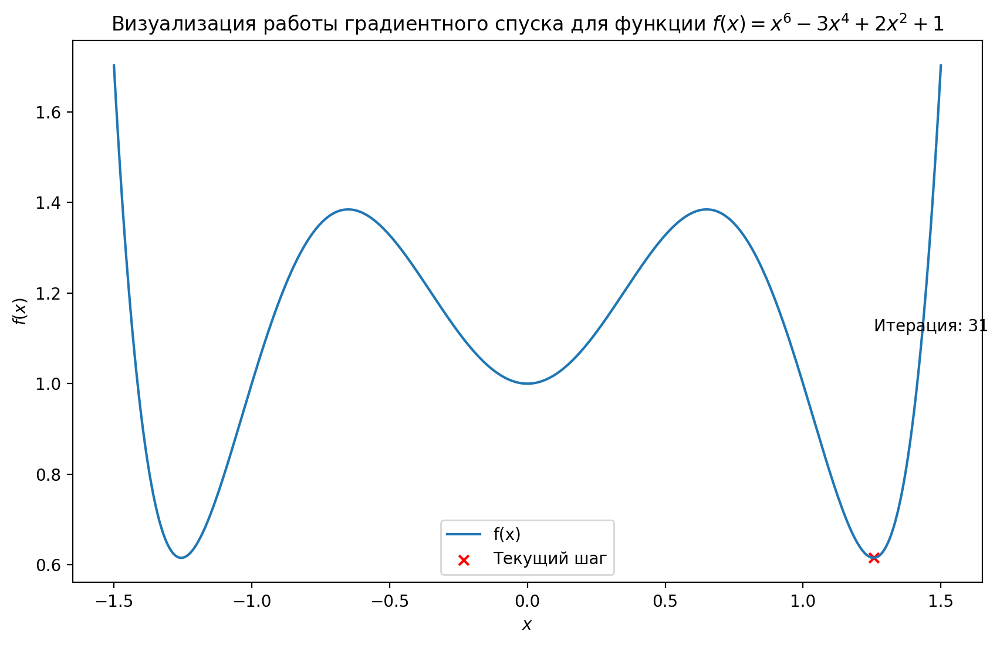

Сходимость достигнута на итерации 31


In [49]:
# Использование функции gradient_descent_visualization с start_point=1
gradient_descent_visualization(grad_f, start_point=1)

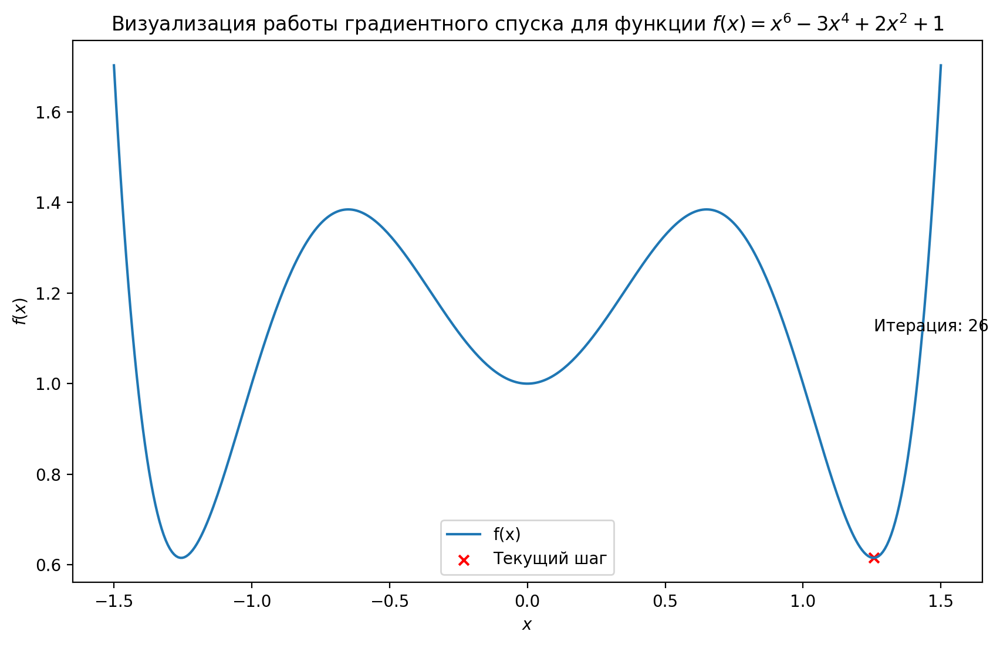

Сходимость достигнута на итерации 26


In [50]:
# Использование функции gradient_descent_visualization с start_point=1.5
gradient_descent_visualization(grad_f, start_point=1.5)

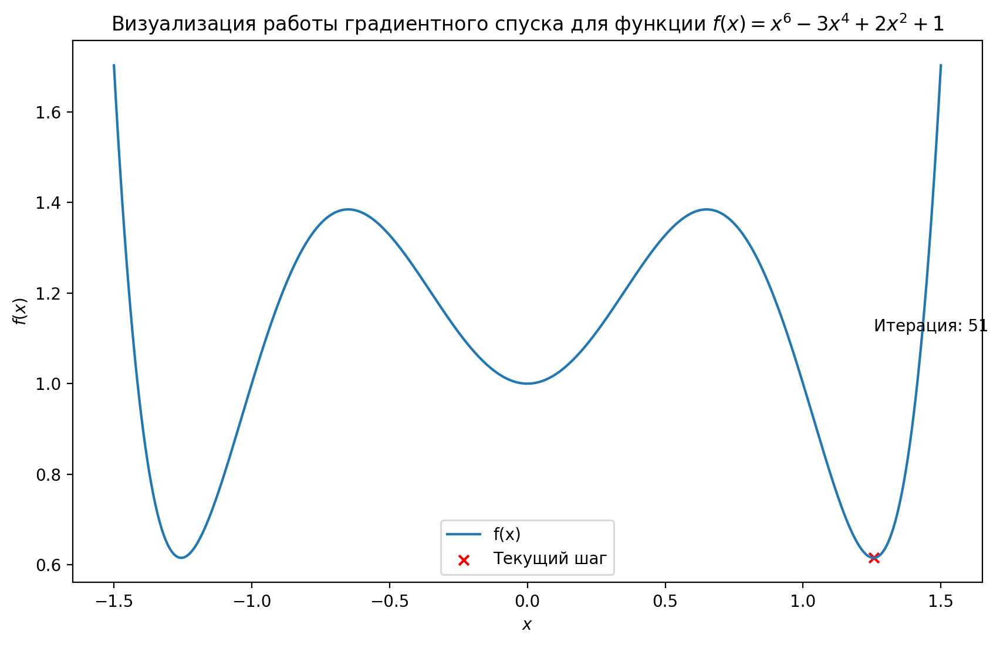

Сходимость достигнута на итерации 51


In [51]:
# Использование функции gradient_descent_visualization с start_point=5
gradient_descent_visualization(grad_f, start_point=5)

### Задача 4. Визуализация градиентного спуска для трехмерной функции (4 балла)
В теории оптимизации есть достаточно известная [функция Розенброка](https://en.wikipedia.org/wiki/Rosenbrock_function). Она используется для проверки производительности алгоритмов.

Постройте трехмерную визуализацию (`plt.surface()` или ее двумерные аналоги, например, `plt.contourf()`), работы градиентного спуска для функции Розенброка:  
$f(x) = (1-x_1)^2+100(x_2-x_1^2)^2$ 

В качестве визуализации текущего расположения градиентного спуска лучше использовать линейный график красного цвета, чтобы отследить блуждания функции в трехмерном пространстве. Визуализацию снабдите названием, подписями к осям, а также добавьте текст с номером итерации (цвет выбирайте в зависимости от читаемости). Положение точки градиентного спуска на итерации `n` лучше изобразить через `Line plot`.

Пример работы `plt.contourf()`:
```
x = np.arange(1, 10)
y = x.reshape(-1, 1)
h = x * y

fig, (ax1, ax2) = plt.subplots(ncols=2)

ax1.set_title("origin='upper'")
ax2.set_title("origin='lower'")
ax1.contourf(h, levels=np.arange(5, 70, 5), extend='both', origin="upper")
cs2 = ax2.contourf(h, levels=np.arange(5, 70, 5), extend='both', origin="lower")
fig.colorbar(cs2, ax=ax2, shrink=0.9)

plt.show()
```

In [52]:
# Функция Розенброка и ее производные
def rosenbrock(x, y):
    """
    Функция вычисляет значение функции Розенброка для заданных x и y (двух переменных).
    
    Параметры:
    x (np.ndarray): Массив значений x.
    y (np.ndarray): Массив значений y.
    
    Возвращает:
    np.ndarray: Массив значений функции для массивов x и y.
    """
    return (1 - x)**2 + 100*(y - x**2)**2

def grad_rosenbrock(x, y):
    """
    Вычисляет градиент функции Розенброка в точке (x, y).
    
    Параметры:
    x (float): Значение переменной x.
    y (float): Значение переменной y.
    
    Возвращает:
    np.array: Вектор градиента функции Розенброка в точке (x, y),
    где первый элемент - производная по x, второй - производная по y.
    """
    grad_x = -2 * (1 - x) - 400 * x * (y - x**2)
    grad_y = 200 * (y - x**2)
    return np.array([grad_x, grad_y])

In [54]:
def gradient_descent_visualization_3d(grad, start_point, learning_rate=0.005, gamma=0.0, tolerance=1e-4, max_iterations=5000):
    """
    Функция выполняет градиентный спуск для функции Розенброка с интерактивной трехмерной визуализацией на каждой итерации.
    
    Параметры:
    grad (callable): Функция, вычисляющая градиент целевой функции.
    start_point (float): Начальная точка для поиска минимума.
    learning_rate (float): Размер шага.
    gamma (float): Коэффициент моментума.
    tolerance (float): Пороговое значение изменения функции для остановки алгоритма.
    max_iterations (int): Максимальное количество итераций.
   
    Возвращает:
    Ничего не возвращает.
    """
    x, y = start_point
    # Начальная скорость изменений для x и y
    v = np.zeros(2)

    for i in range(max_iterations):
        # Очистка вывода и отображение графика
        clear_output(wait=True)
        fig = plt.figure(figsize=(12, 8))
        ax = fig.add_subplot(111, projection='3d')
        X, Y = np.meshgrid(np.linspace(-2, 2, 400), np.linspace(-1, 3, 400))
        Z = rosenbrock(X, Y)
        ax.plot_surface(X, Y, Z, cmap='viridis', alpha=0.5)

        gradient = grad(x, y)
        clipped_gradient = np.clip(gradient, -10, 10)
        # Обновление скорости с учетом моментума
        v = gamma*v + learning_rate*clipped_gradient
        # Обновление положения x
        x -= v[0]
        y -= v[1]

        # Отображение текущей точки с линией направления градиента
        ax.scatter(x, y, rosenbrock(x, y), color='red', s=50, label='Текущий шаг')
         # Масштабирующий коэффициент для уменьшения длины линии
        scale_factor = 0.2 
        ax.plot([x, x - scale_factor*clipped_gradient[0]], 
                [y, y - scale_factor*clipped_gradient[1]], 
                [rosenbrock(x, y), rosenbrock(x, y) - scale_factor*(clipped_gradient[0]**2 + clipped_gradient[1]**2)], 
                'r-', linewidth=2, label='Направление градиента')

        # Пределы для осей
        ax.set_xlim([-2, 2])
        ax.set_ylim([-1, 3])
        ax.set_zlim([0, 2500])
        
        # Добавление подписей и заголовка
        ax.set_xlabel('$x$')
        ax.set_ylabel('$y$')
        ax.set_zlabel('$f(x, y)$')
        ax.set_title('Визуализация работы градиентного спуска для функции Розенброка')

        # Вывод номера текущей итерации
        ax.text2D(0.5, 0.9, f'Итерация: {i+1}', transform=ax.transAxes, ha='center', fontsize=10)

        plt.legend()
        plt.show()
        # Пауза
        plt.pause(0.05)

        # Проверка условия на сходимость
        if np.linalg.norm(clipped_gradient) < tolerance:
            print(f'Сходимость достигнута на итерации {i+1}.')
            break

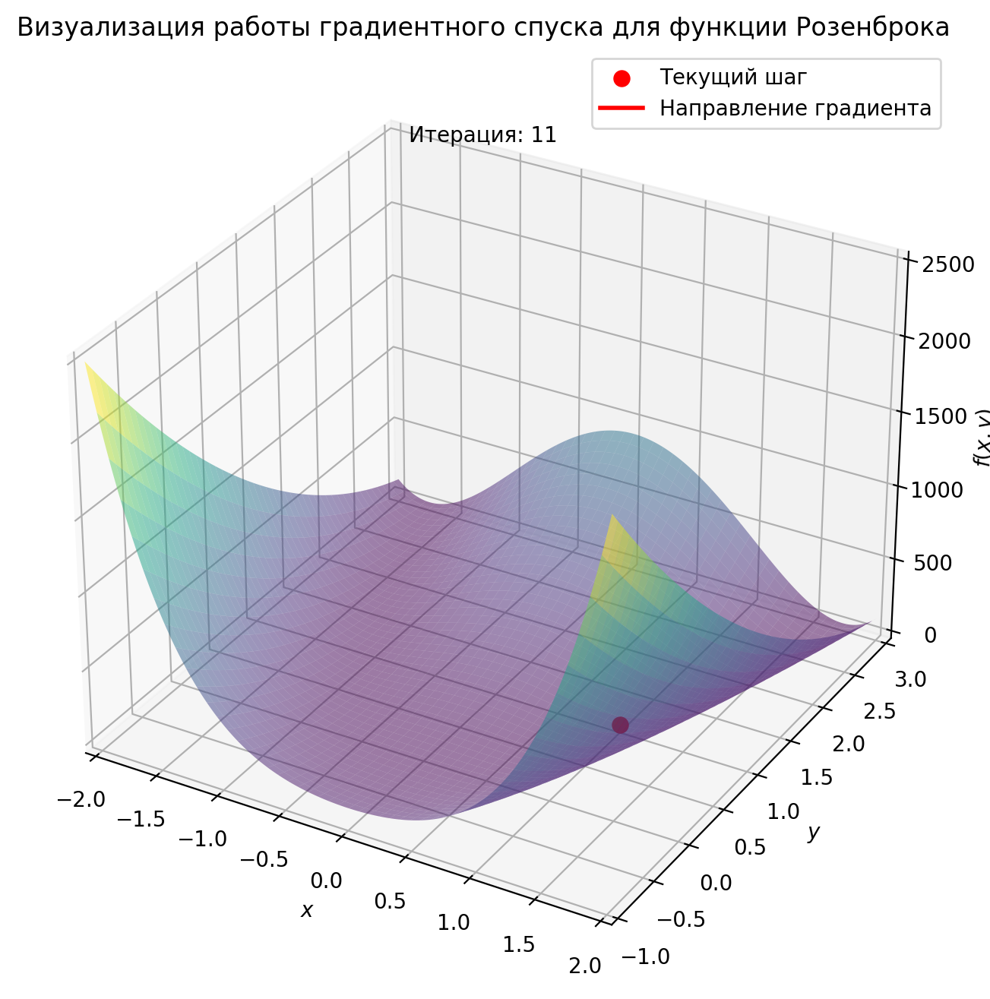

Сходимость достигнута на итерации 11.


In [55]:
# Использование функции gradient_descent_visualization_3d с start_point=(0.5, 1.5)
start_point = (0.5, 1.5)
gradient_descent_visualization_3d(grad_rosenbrock, start_point)